In [1]:
import numpy as np
import MDAnalysis as mda
from MDAnalysis.analysis import distances
import torch 
import torch.nn as nn
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from deeptime.util.data import TrajectoryDataset
from deeptime.util.torch import MLP
from deeptime.decomposition import VAMP
from deeptime.decomposition.deep import VAMPNet, koopman_matrix
from deeptime.util.validation import implied_timescales, ck_test
from deeptime.plots import plot_implied_timescales, plot_ck_test
from tqdm.notebook import tqdm
from tqdm import tqdm


/localscratch/zippoema/lib/python_envs/hpa_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/localscratch/zippoema/lib/python_envs/hpa_env/lib/python3.11/site-packages/MDAnalysis/topology/TPRParser.py:160: DeprecationWarning: 'xdrlib' is deprecated and slated for removal in Python 3.13
  import xdrlib


In [2]:
import sys
import os

# Absolute path to your module's directory
module_path = os.path.abspath('/localscratch/zippoema/git/HPA/src/')
if module_path not in sys.path:
    sys.path.insert(0, module_path)

import hpa.util
import hpa.msm
import hpa.plots

In [3]:
plt.style.use('/localscratch/zippoema/md_plots/plot.mplstyle')

In [4]:
path = '/localscratch/zippoema/project_ness/simulations/simple-ness_CAL3/'
path_tr = '/media/zippoema/Elements/zippo_phd_data/additional_simulations/single-tdp43/data_hps/sim_no-phospho/'

## Create distances file


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [00:03<00:00, 5488.59it/s]


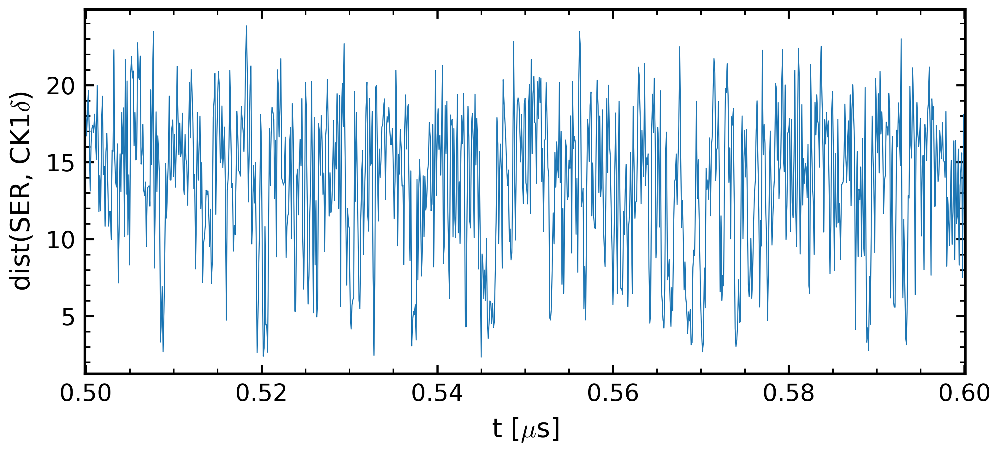

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [00:03<00:00, 5560.66it/s]


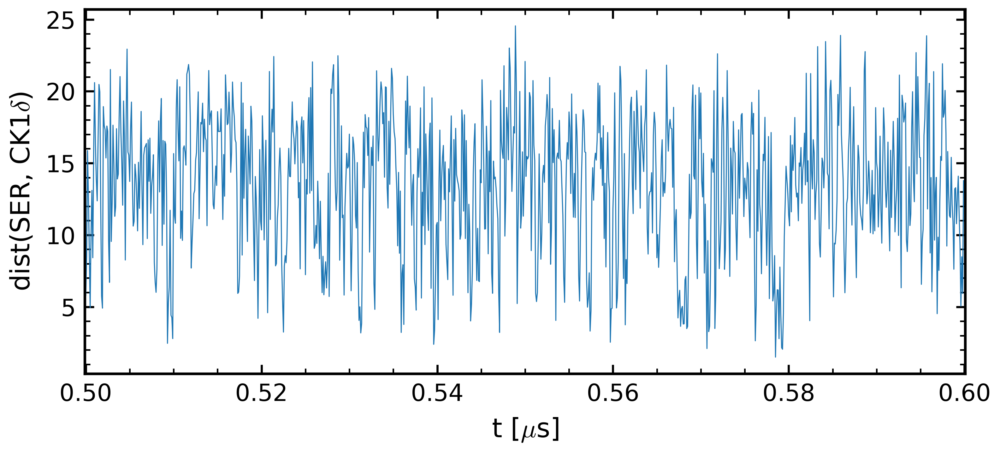

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [00:03<00:00, 5523.71it/s]


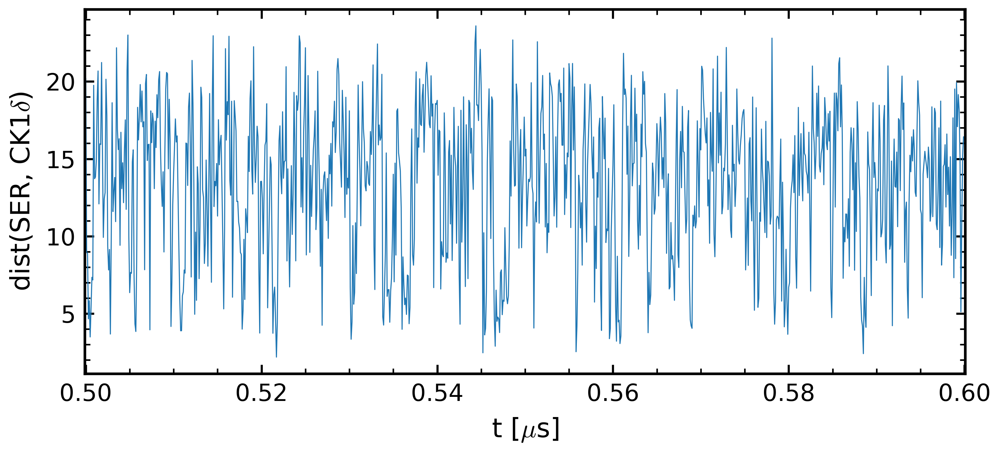

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [00:03<00:00, 5466.02it/s]


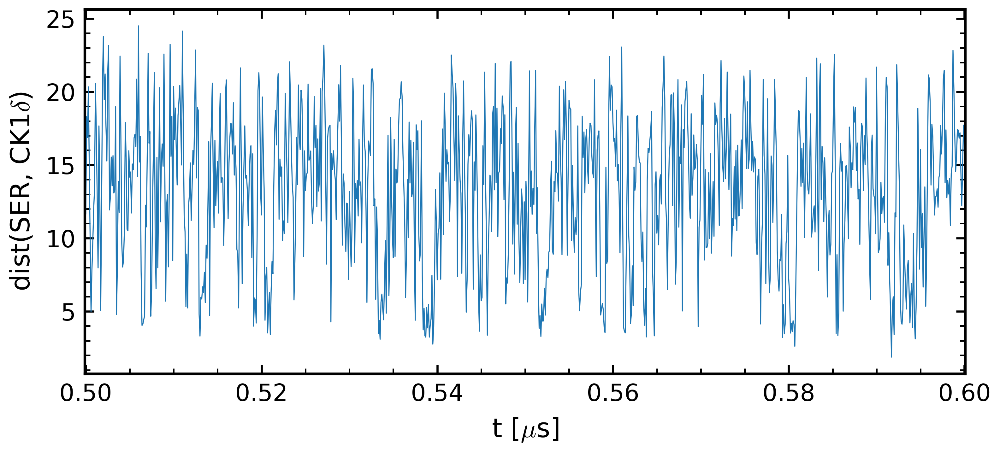

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [00:03<00:00, 5558.43it/s]


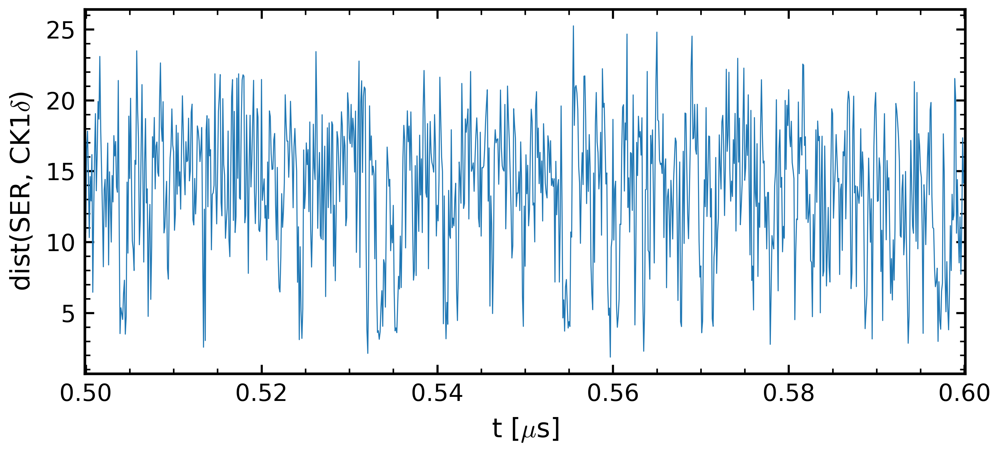

In [6]:
for s in range(1,6):
    d = hpa.util.create_distance_file(path+f'sim_ser19_dmu-5_1-tdp43-2pser_1-ck1d-open/sim{s}_ser19_dmu-5_1-tdp43-2pser_com-ck1d-open_CAL3_dump.gsd', 
                                         id1=[300,301,302], id2=[i for i in range(154)], mean1=True, therm=0)
    #tmp = hpa.util.create_distance_file(path+f'sim_ser19_dmu-10_1-tdp43-2pser_1-ck1d-open/sim{s}_ser19_dmu-10_1-tdp43-2pser_com-ck1d-open_CAL3_dump.gsd', 
    #                                     id1=[445+92,445+94,445+120,445+152,445+283], id2=[i for i in range(154)], mean1=True, therm=0)
    #d = np.append(d, tmp, axis=1)
    np.savetxt(path+f'sim_ser19_dmu-5_1-tdp43-2pser_1-ck1d-open/sim{s}_ser19_dmu-5_1-tdp43-2pser_com-ck1d-open_CAL3_dist.txt', d)
    hpa.plots.plot_dist(d,part_id=5,start=5000,end=6000)

In [5]:
# CUDA or CPU
if torch.cuda.is_available():
        device = torch.device("cuda")
        torch.backends.cudnn.benchmark = True
        print("cuda")
else:
        device = torch.device("cpu")
        print("cpu")
torch.set_num_threads(12)

cuda


In [64]:
# MACROs
''' VAMPnet hyper-parameters '''
val_perc = 0.3
nodes = [154*2, 80, 30, 5]
learn_rate = 0.5e-2
batch_sz = 10000
epochs = 20
eps_regularize = 1e-07
TLAG=5

# Dataset

### Trajectory

Load trajectory data for training

In [7]:
dist_ser = np.loadtxt(path_tr+"sim1_no-phospho_ck1d-rigid_tdp43_dist.txt")[1000:]
dist_ser2 = np.loadtxt(path_tr+"sim2_no-phospho_ck1d-rigid_tdp43_dist.txt")[1000:]
dist_ser = np.append(dist_ser, dist_ser2, axis=0)
dist_ser2 = np.loadtxt(path_tr+"sim3_no-phospho_ck1d-rigid_tdp43_dist.txt")[1000:]
dist_ser = np.append(dist_ser, dist_ser2, axis=0)

Data for TDP-43 + CK1d + PP3

In [65]:
i = 1
dist_ser = np.loadtxt(path+f'sim{i}_ser19_dmu-5_0_1-tdp43-2pser_com-ck1d-open_com-pp3_CAL3_dist.txt')[500:]
for i in range(2,11):
    tmp = np.loadtxt(path+f'sim{i}_ser19_dmu-5_0_1-tdp43-2pser_com-ck1d-open_com-pp3_CAL3_dist.txt')[500:]
    dist_ser = np.append(dist_ser, tmp, axis=0) 

In [66]:
print(dist_ser.shape)

(195000, 308)


Dataset with trajectory, split into training and validation datasets (70% and 30%)

In [67]:
dataset_ser = TrajectoryDataset(TLAG, dist_ser.astype(np.float32))

n_val_ser = int(len(dataset_ser)*val_perc)
train_data_ser, val_data_ser = torch.utils.data.random_split(dataset_ser, [len(dataset_ser) - n_val_ser, n_val_ser])


### Creating VAMPNet

VAMPnet lobe 

In [68]:
lobe = nn.Sequential(
    nn.BatchNorm1d(nodes[0]),
    nn.Linear(nodes[0], nodes[1]), nn.ELU(),
    nn.Linear(nodes[1], nodes[2]), nn.ELU(),
    nn.Linear(nodes[2], nodes[3]),
    nn.Softmax(dim=1)  # obtain fuzzy probability distribution over output states
)
print(lobe)
lobe = lobe.to(device=device)
vampnet_ser = VAMPNet(lobe=lobe, learning_rate=learn_rate, device=device, epsilon=eps_regularize)

loader_train_ser = DataLoader(train_data_ser, batch_size=batch_sz, shuffle=True)
loader_val_ser = DataLoader(val_data_ser, batch_size=len(val_data_ser), shuffle=False)


Sequential(
  (0): BatchNorm1d(308, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (1): Linear(in_features=308, out_features=80, bias=True)
  (2): ELU(alpha=1.0)
  (3): Linear(in_features=80, out_features=30, bias=True)
  (4): ELU(alpha=1.0)
  (5): Linear(in_features=30, out_features=5, bias=True)
  (6): Softmax(dim=1)
)


### Training

In [69]:
model_ser = vampnet_ser.fit(loader_train_ser, n_epochs=epochs,
                        validation_loader=loader_val_ser).fetch_model()

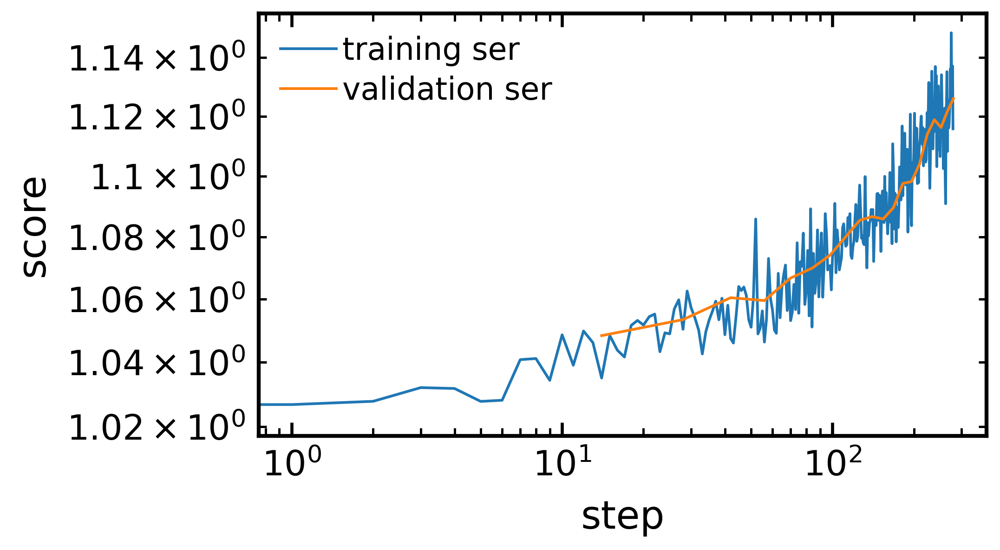

1.1157760620117188
1.1259591579437256


In [70]:
plt.loglog(*vampnet_ser.train_scores.T, label='training ser', linewidth=0.7)
plt.loglog(*vampnet_ser.validation_scores.T, label='validation ser', linewidth=0.7)
plt.xlabel('step')
plt.ylabel('score')
plt.legend()
plt.show()

print(vampnet_ser.train_scores.T[1,-1])
print(vampnet_ser.validation_scores.T[1,-1])


In [71]:
# Transform distance into percentage of being in state 0 or 1 
featser_ser = model_ser.transform(dist_ser)

# assign 0 if percentage of state 0 is over 50%, otherwise 1
assignsser_ser = featser_ser.argmax(1)
print((np.min(assignsser_ser),np.max(assignsser_ser)))


(0, 4)


### Check VAMPNet result 


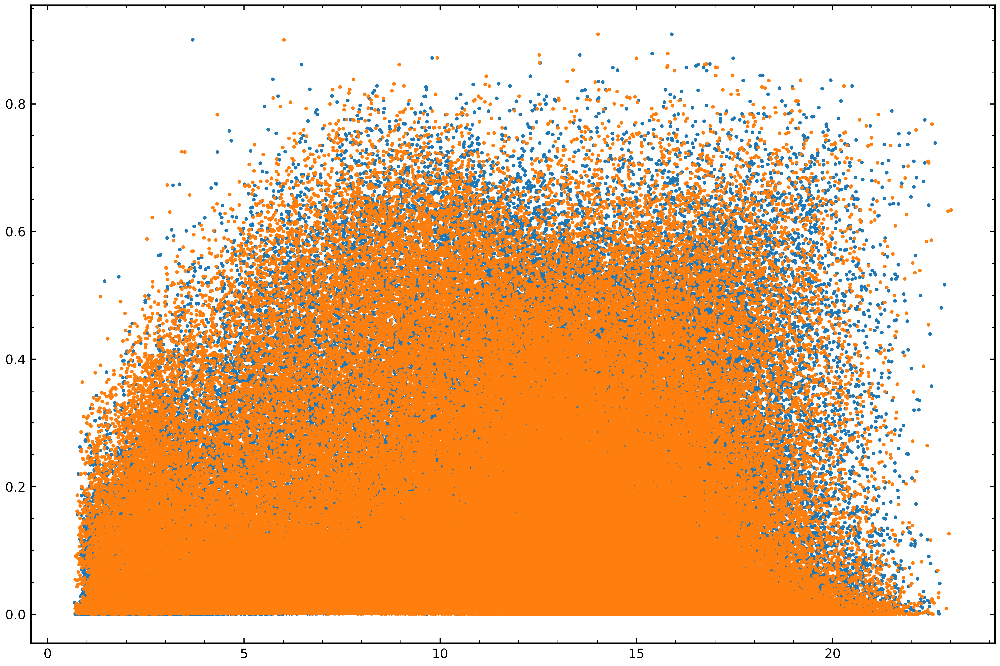

In [73]:
f, axes = plt.subplots(1, 1, figsize=(12, 8))
axes.plot(np.min(dist_ser[:,:154],axis=1), featser_ser[:, 0], ".")
axes.plot(np.min(dist_ser[:,154:],axis=1), featser_ser[:, 0], ".")


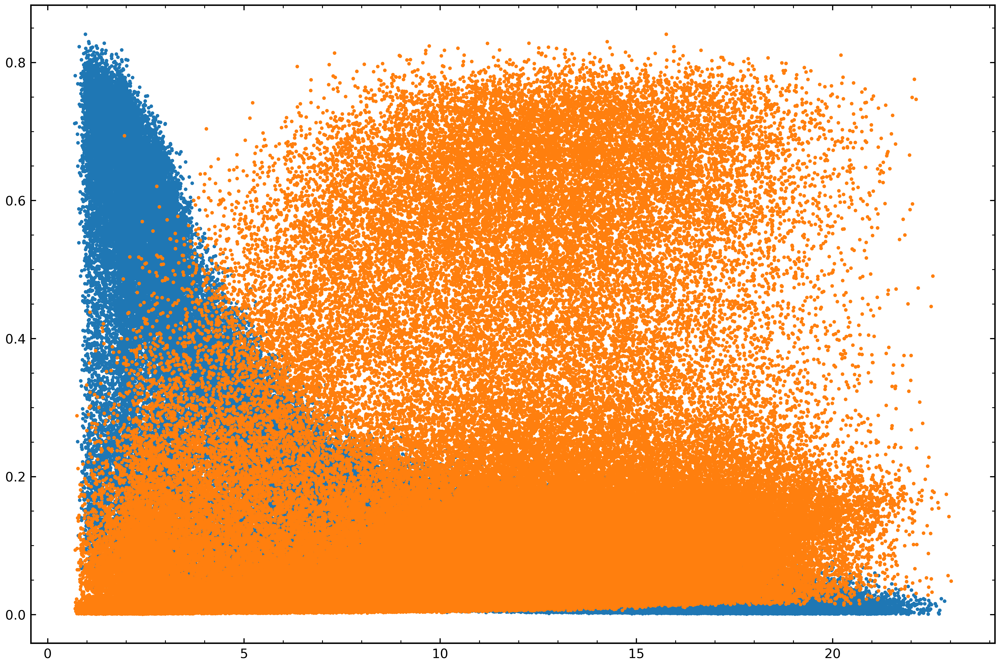

In [79]:
f, axes = plt.subplots(1, 1, figsize=(12, 8))

axes.plot(np.min(dist_ser[:,:154],axis=1), featser_ser[:, 2], ".")
axes.plot(np.min(dist_ser[:,154:],axis=1), featser_ser[:, 2], ".")


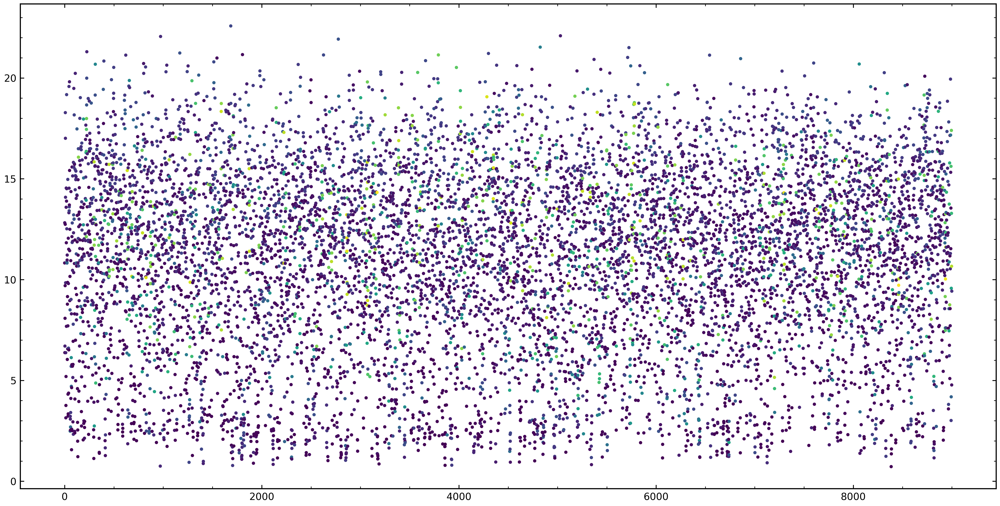

In [81]:
f, axes = plt.subplots(1, 1, figsize=(16, 8))
#axes.scatter(np.arange(len(dist_ser[:9000])), dist_ser[:9000,100], c=featser_ser[:9000,2], s=4)
axes.scatter(np.arange(len(dist_ser[:9000])), np.min(dist_ser[:9000,154:],axis=1), c=featser_ser[:9000,2], s=4)

In [20]:
vamp_estimator = VAMP(lagtime=TLAG, observable_transform=model_ser)
vamp = vamp_estimator.fit(dist_ser.astype(np.float32)).fetch_model()
print(f"VAMP-2 score under lag {TLAG}: s = {vamp.score(2).round(2)}")

VAMP-2 score under lag 5: s = 1.95


100%|████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.93s/it]


Text(0, 0.5, 'timescale')

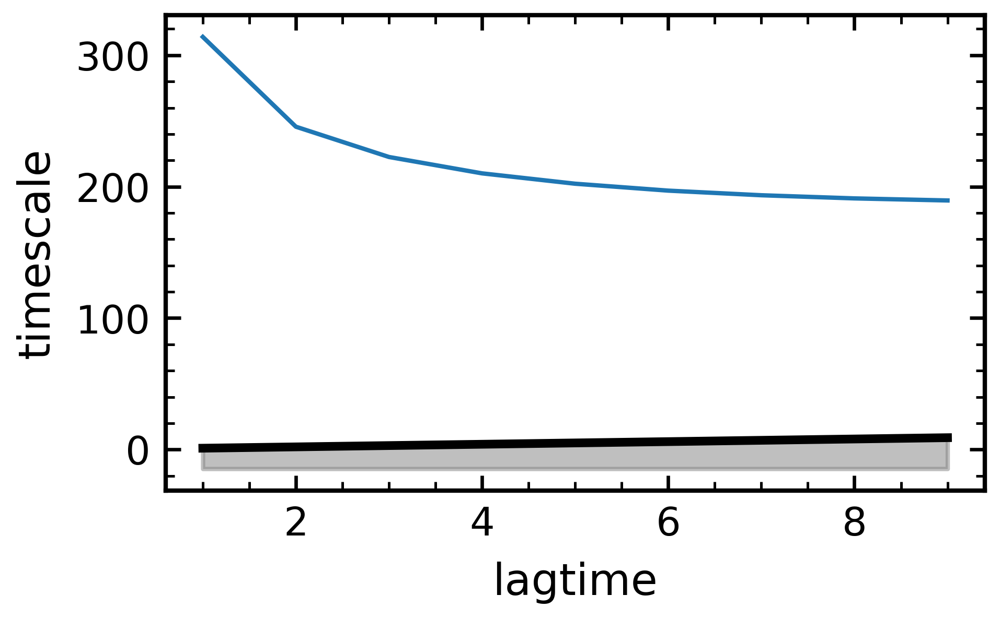

In [21]:
lagtimes = np.arange(1, 10, dtype=np.int32)
vamp_models = [VAMP(lagtime=lag, observable_transform=model_ser).fit_fetch(dist_ser.astype(np.float32)) for lag in tqdm(lagtimes)]

ax = plot_implied_timescales(implied_timescales(vamp_models))
ax.set_xlabel('lagtime')
ax.set_ylabel('timescale')

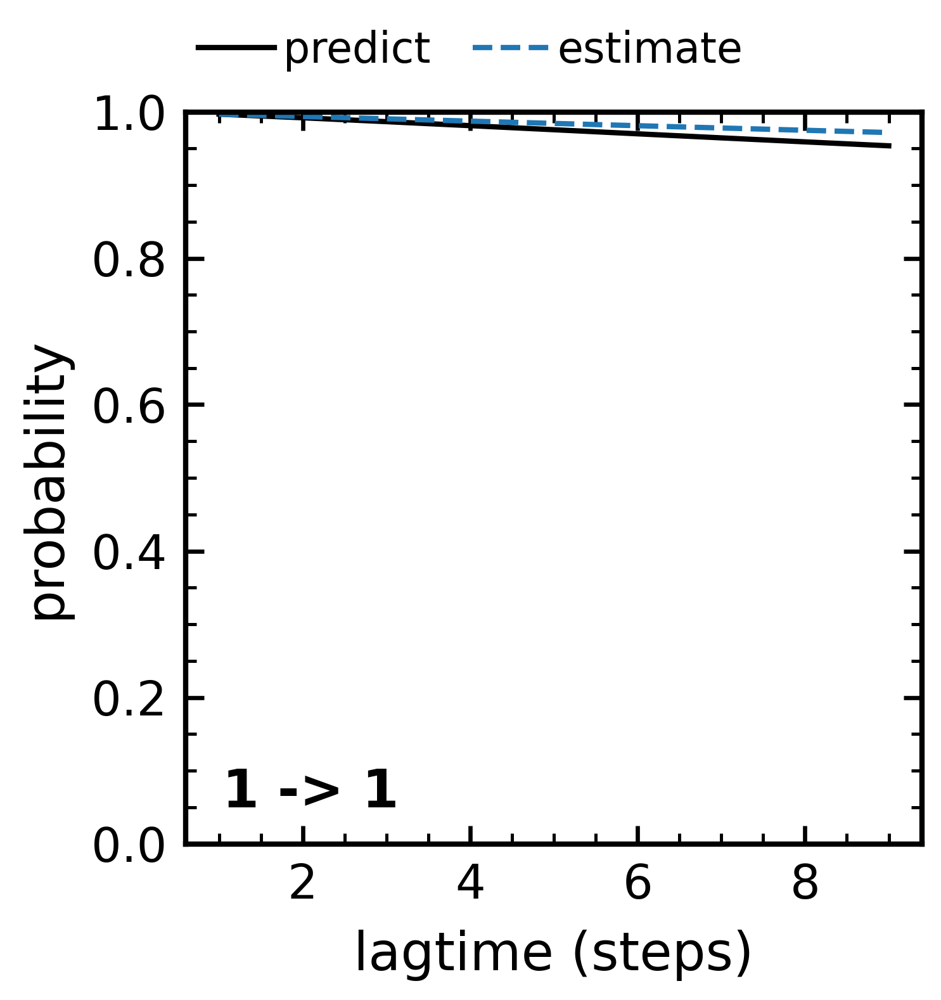

In [22]:
plot_ck_test(vamp_models[0].ck_test(vamp_models));


## Transform trajectory

Transform simulation trajectory into discrete trajectory of bound/unbound state

In [99]:
# Select NESS simulation
s = 5

In [100]:
dist = np.loadtxt(path+f'sim{s}_ser19_dmu-5_0_1-tdp43-2pser_com-ck1d-open_com-pp3_CAL3_dist.txt')

print(len(dist))

feat_ser = model_ser.transform(dist)

print(feat_ser[0], dist[0][0])

20000
[0.14013587 0.8598641 ] 15.586109280319917


In [101]:
assigns_ser = hpa.msm.inserting_tps_state(feat_ser.argmax(1), feat_ser[:,0], 0.3)

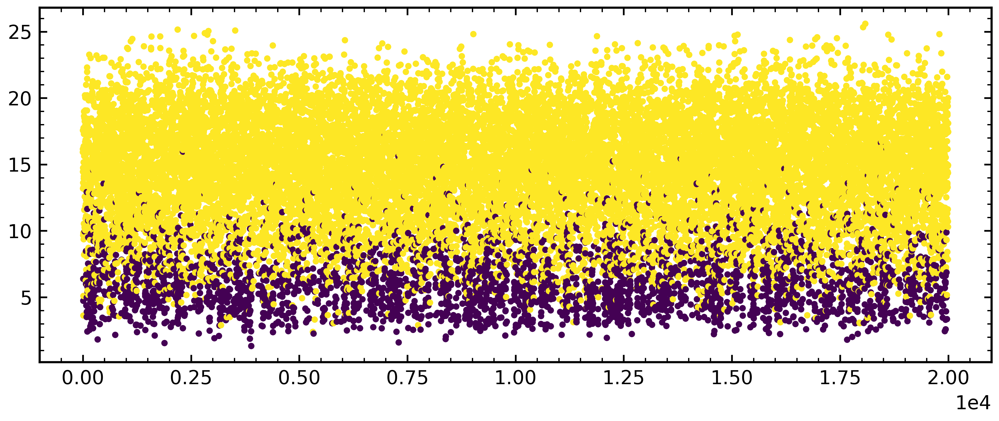

In [102]:
f, axes = plt.subplots(1, 1, figsize=(8, 3))

axes.scatter(np.arange(len(dist[:20000,1])), dist[:20000,1], c=assigns_ser[:20000], s=4)
plt.show()

In [103]:
# Filter out intermediate state using Transition-based analysis
filtered_dtraj = hpa.msm.transition_filter_state_trj(assigns_ser, tps_state_num=2).astype("bool")

print(filtered_dtraj[0], dist[0][0])

True 15.586109280319917


In [104]:
# if state 0 of VAMPnet is bound, swap state 1 and state 0
filtered_dtraj = ~filtered_dtraj

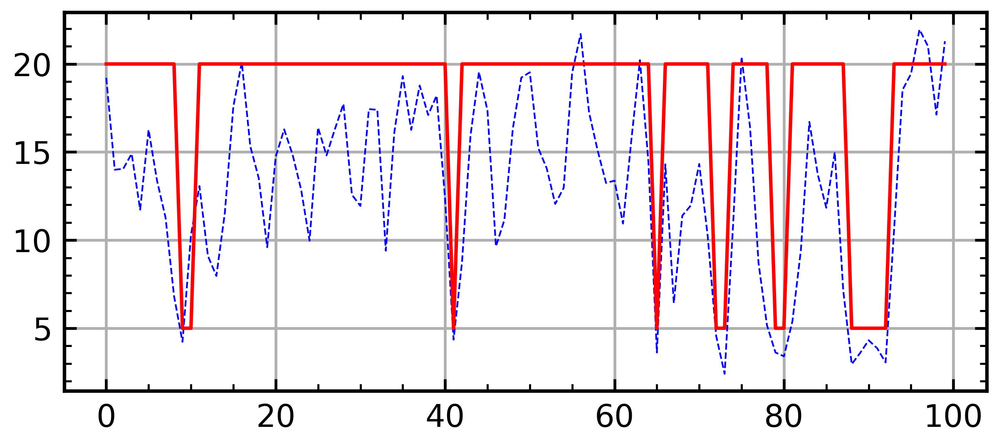

In [107]:
plt.figure(figsize=(4.77,1.97))
plt.plot(dist[0:100,140], '--b', linewidth=0.5)
plt.plot(15*~filtered_dtraj[0:100]+5, 'r')
plt.grid()
plt.show()

In [106]:
np.savetxt(path+f'sim{s}_ser19_dmu-5_0_1-tdp43-2pser_com-ck1d-open_com-pp3_CAL3_boundtraj.txt', filtered_dtraj)